<a href="https://colab.research.google.com/github/Victorlouisdg/differentiable-cloth-folding/blob/master/cloth.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Differentiable Cloth Simulator

In this notebook we show how to create a simple differentiable cloth simulation.
Going through the previous notebook on spring simulation might make understanding this notebook easier, but it is not necessary.

The cloth will be simulated simply by a grid of point masses connected with springs, as shown in the image below.

<img src="https://drive.google.com/uc?export=view&id=1jdjDeOi5AdYdqlhTyBAoaqg2un0nTFd3" alt="Drawing" width="600"/>

### JAX
Throughout this notebook we will use [JAX](https://github.com/google/jax).
JAX allows automatically calculates the derivates of our code with only some minor adjustments needed from vanilla Python/Numpy code.
As a nice bonus, JAX can also jit-compile our code to make it much faster and runnable on GPU/TPU.


In [7]:
import jax 
import jax.numpy as jnp
from jax import jit, vmap, grad
import jax.numpy as jnp
from functools import partial

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
matplotlib.rc('animation', html='jshtml')

### Creating the grid

In [10]:
rows = cols = 5
n_masses = rows * cols
mass_ids = jnp.array([i for i in range(n_masses)])
print('Mass ids:', mass_ids)

length = 1.0
l_rest = length / (rows - 1)
print('Rest length of the springs: ' + str(l_rest) + 'm')

Mass ids: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]
Rest length of the springs: 0.25m


We initialize the positions to a grid and the velocities to zero.


In [13]:
def init_position(i, cols, l_rest):
    x = l_rest * jnp.floor(i / cols)
    y = 0
    z =  l_rest * (i % cols)
    return jnp.array([x, y, z], dtype=jnp.float32)


p0 = jnp.array([init_position(i, cols, l_rest) for i in jnp.arange(n_masses)])
v0 = jnp.zeros((n_masses, 3))
s0 = jnp.hstack((p0, v0))

print('Shape of the cloth state: ', s0.shape)
print('State of the 5 first masses: \n', s0[:5])

Shape of the cloth state:  (25, 6)
State of the 5 first masses: 
 [[0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.25 0.   0.   0.  ]
 [0.   0.   0.5  0.   0.   0.  ]
 [0.   0.   0.75 0.   0.   0.  ]
 [0.   0.   1.   0.   0.   0.  ]]


### Visualizing the piece of cloth
Note: the triangulation used here is only for visualization. It does not correspond exactly with the how the springs are layed out.

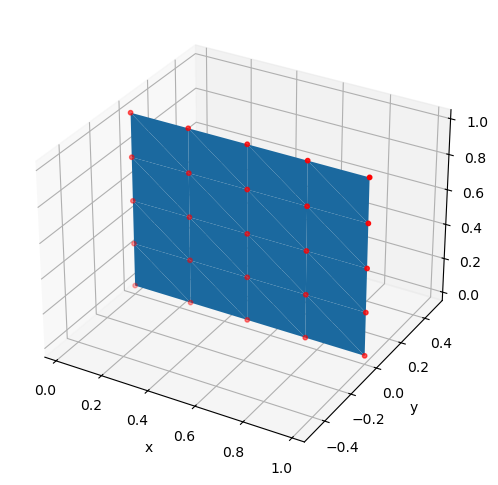

In [35]:
def triangulate(rows, cols):
    triangles = []
    for i in range(rows - 1):
        for j in range(cols - 1):
            k = j + i * cols
            tri1 = (k, k + cols, k + 1)
            tri2 = (k + 1, k + cols, k + cols + 1)
            triangles.append(tri1)
            triangles.append(tri2)
    return triangles


triangles = triangulate(rows, cols)

def plot_cloth(ax, p, 
               xlim=[-0.05, length + 0.05], 
               ylim= [-0.55, 0.55] , 
               zlim=[-0.05, length + 0.05]):
    x, y, z = jnp.transpose(p)
    ax.clear()  # necessary for the animations
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_zlim(zlim)
    ax.plot_trisurf(x, y, z, triangles=triangles)
    ax.scatter(x, y, z, c='red', s=10)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')


fig = plt.figure(figsize=(8, 6), dpi=100)
ax = fig.add_subplot(111, projection='3d')
plot_cloth(ax, p0)

### Specifying spring connections



In [70]:
# Physical constants
m = 1.0 / n_masses  # kg
k = 100.0           # N / m
c = 20.0            # N / (m/s)
g = 9.80665         # m/s^2
ag = jnp.array([0.0,0, 0])  # acceleration due to gravity

The code in the cell below creates arrays with for each mass index (ix), the index of that mass' neighbor in a certain directions. lix for example will hold the indexes of the left neighbors. If a mass has no neighbor in a certain direction, its own index is used as a placeholder.

<img src="https://drive.google.com/uc?export=view&id=1I0hto76-MHA__XzdpCRo5C-zhnE_6ooV" alt="index_grid" width="250"/>

In [73]:
def shifted_ix(di, dj):
    i, j = jnp.meshgrid(jnp.arange(rows), jnp.arange(cols), indexing='ij')

    # Where bounds are ok for shifted index, use it, else use original index
    result = jnp.where((i + di >= 0) & (i + di < rows) &
                      (j + dj >= 0) & (j + dj < cols),
                      cols * (i + di) + j + dj,
                      cols * i + j)

    return jnp.ravel(result)


lix = shifted_ix(0, -1)
tix = shifted_ix(-1, 0)
rix = shifted_ix(0, 1)
bix = shifted_ix(1, 0)


ks = jnp.array(4 * [k])
cs = jnp.array(4 * [c])
l_rests = jnp.array(4 * [l_rest])
ixs = jnp.array([lix, tix, rix, bix])

### Simulation

In the cell below, we use another incredibly useful feature of JAX: `vmap`.
This allows us to transfrom a function that takes a single value as input into one that takes an array of values as input.

In the code below we use it twice:


1.   The first time, we map our `hooke_damped` function over its state inputs. The result of this `vmap` is a `hdv` function that takes as input not a single point mass and outputs a force, but instead it takes all point masses as input and calculates a force for all of them.
2.   The `hdv` function from above calculates the forces for all the point masses, but only for one type of spring, for example, all springs that connect a mass to its left  neighbors. To calculate the contributions of all types of springs, we `vmap` a second time over springs specifications.





In [77]:
def hooke_damped(pa, pb, va, vb, k, c, l_rest):
    d = pb - pa
    l = jnp.linalg.norm(d)
    l_non_zero = jnp.max(jnp.array([l, l_rest / 10]))
    u = d / l_non_zero # unit vector of 1m (or smaller)
    x = (l - l_rest) * u  # note that is this actually corresponds with -x in the formulas for Hooke's law 

    # Damping
    v_rel = vb - va  # relative velocity between the point masses
    x_dot = jnp.dot(v_rel, u) * u  # this actually corresponds with -x_dot

    F = k * x + c * x_dot
    return F


hdv = vmap(hooke_damped, in_axes=(0, 0, 0, 0, None, None, None))

def hooke_damped_state(p, v, k, c, lr, ix):
    return hdv(p, p[ix], v, v[ix], k, c, lr)


hdsv = vmap(hooke_damped_state, in_axes=(None, None, 0, 0, 0, 0))


@jit
def hooke_damped_all(p, v):
    return jnp.sum(hdsv(p, v, ks, cs, l_rests, ixs), axis=0)

In [79]:
immovable_masses = [0, cols * (rows - 1)]

@jit
def change_of(s):
    p, v = jnp.hsplit(s, 2)
    F = hooke_damped_all(p, v)
    a = F / m
    a += ag
    a = a.at[immovable_masses, :].set(0.0)
    return jnp.hstack((v, a))

    
print(change_of(s0)[:5])

[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]


In [81]:
timesteps = 3000          
dt = 0.001

@partial(jit, static_argnums=(0,))
def RK4(f, s, dt):
    k1 = f(s)
    k2 = f(s + k1 * (dt / 2))
    k3 = f(s + k2 * (dt / 2))
    k4 = f(s + k3 * dt)
    s_new = s + (k1 + 2 * k2 + 2 * k3 + k4) * (dt / 6)
    return s_new


def simulate_RK4(s0, timesteps, dt):
    history = [s0]
    s = s0
    for t in range(timesteps):
        s = RK4(change_of, s, dt)
        history.append(s)

    return history

history = simulate_RK4(s0, timesteps, dt)

### Animation

In [86]:
def animate_cloth(s_history, dt, fps=50):
    fig = plt.figure(figsize=(5, 5), dpi=100)
    fig.subplots_adjust(0,0,1,1,0,0)
    ax = fig.add_subplot(111, projection='3d')
    plt.close()  # prevents duplicate output 

    fps_simulation = 1 / dt
    skip = jnp.floor(fps_simulation / fps).astype(jnp.int32)
    fps_adjusted = fps_simulation / skip
    print('fps was adjusted to:', fps_adjusted)

    def animate(i):
        j = min(i * skip, len(s_history) - 1)
        p = s_history[j][:, 0:3]
        plot_cloth(ax, p, zlim=[-2.0, 0.1])
        ax.text2D(0.1, 0.9, 't = {:.3f}s'.format(j * dt), transform=ax.transAxes)


    n_frames = (len(s_history) - 1) // skip + 1  # this +1 is for the initial frame
    if not (len(s_history) - 1) % skip == 0:
        n_frames += 1  # this +1 is to ensure the final frame is shown

    anim = animation.FuncAnimation(fig, animate, frames=n_frames, interval=1000*dt*skip)


    return anim

animate_cloth(history, dt)

fps was adjusted to: 50.0
